<a href="https://colab.research.google.com/github/guillermo-gomez/picking-route/blob/main/Evidencia_2_Punto_1_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Evidencia 2
# Análisis Dataset: https://allisonhorst.github.io/palmerpenguins/index.html

Fuente Dataset:

Consta de atributos de tres especies de pingüinos: Adelia, Gentoo y Chinstrap.

Para consultar más detalles puedes utilizar el siguiente recurso:

palmerpenguins V 0.1.1

Método: Análisis Supervisado | Python y la librería Scikit-Learn

# 1. Installing Packages

Auto-Setup

In [1]:
# Auto-setup when running on Google Colab
if 'google.colab' in str(get_ipython()):
    !pip install --quiet -r /content/sample_data/requirements.txt --no-cache-dir --use-deprecated=legacy-resolver
    
# General imports
import pandas as pd
from pandas import read_csv
from pandas.plotting import scatter_matrix
import datetime, statsmodels, warnings
import pickle
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
warnings.filterwarnings('ignore')
from datetime import date, timedelta
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import impute, tree, pipeline


In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

# 2.Importing Data
- Dataset:https://allisonhorst.github.io/palmerpenguins/index.html


# Pandas_Profiling

In [3]:
# Auto-setup when running on Google Colab
if 'google.colab' in str(get_ipython()):
    !pip install --quiet https://github.com/pandas-profiling/pandas-profiling/archive/master.zip --no-cache-dir
    !pip install --quiet pandas-profiling[notebook] --no-cache-dir

     / 22.0 MB 55 kB/s


In [4]:
my_data = pd.read_csv('/content/sample_data/penguins_lter.csv',sep=',')#,parse_dates='Date',index_col='Date')

#Process of Reporting Stage 1 (As-Is)
Gatherring & Data 

# **ETL**

# **EXTRACT**

In [5]:
import pandas as pd
from pandas_profiling import ProfileReport

In [6]:
profile1 = ProfileReport(my_data, title="Pandas Profiling Report for Evidence 2 | Stage 1")

In [7]:
profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile1.to_file("my_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Cleaness & Transformation
Data Setting

According to Decision Sheet Planning for ETL

Action has been Taken.


*   Identify Objective
*   Decision for Delete Constant 
*   Features found
*   Select variables for transformation





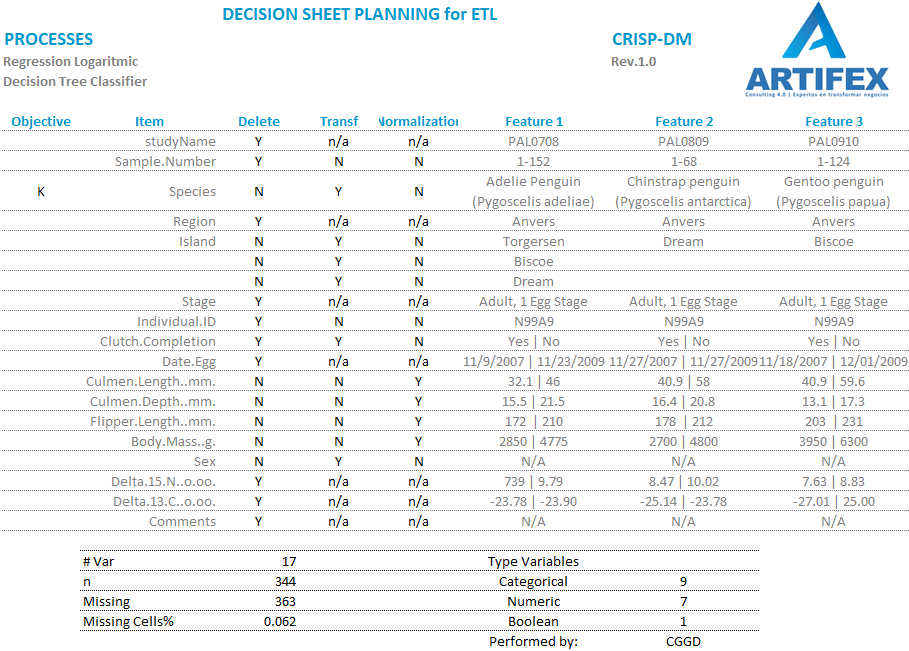

# **TRANSFORM**

Cleaness Raw Data

In [9]:
my_data.isnull().values.any()

True

Delete Colums

In [10]:
my_data = my_data.drop(columns=['studyName','Sample.Number','Region','Stage','Date.Egg','Individual.ID','Clutch.Completion','Delta.15.N..o.oo.','Delta.13.C..o.oo.','Comments'])

Transform Columns

In [11]:
my_data=my_data.dropna()

In [12]:
my_data= my_data.rename(columns = {'Species':'species',
                                   'Island':'island',
                                   'Culmen.Length..mm.':'bill_length_mm',
                                   'Culmen.Depth..mm.':'bill_depth_mm',
                                   'Flipper.Length..mm.':'f_lenght_mm',
                                   'Body.Mass..g.':'body_mass_g',
                                   'Sex':'sex'})

In [13]:
my_data['species'].value_counts()

Adelie Penguin (Pygoscelis adeliae)          146
Gentoo penguin (Pygoscelis papua)            120
Chinstrap penguin (Pygoscelis antarctica)     68
Name: species, dtype: int64

In [14]:
my_data["island"].value_counts()

Biscoe       164
Dream        123
Torgersen     47
Name: island, dtype: int64

In [15]:
my_data["sex"].value_counts()

MALE      168
FEMALE    165
.           1
Name: sex, dtype: int64

In [16]:
my_data['species']=my_data.species.replace({'Adelie Penguin (Pygoscelis adeliae)':1,'Chinstrap penguin (Pygoscelis antarctica)':2,'Gentoo penguin (Pygoscelis papua)':3})
my_data['island']=my_data.island.replace({'Torgersen':1,'Biscoe':2,'Dream':3})
my_data['sex']=my_data.sex.replace({'MALE':1,'FEMALE':0})


In [17]:
my_data.fillna(my_data.mean())

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,1,1,39.1,18.7,181.0,3750.0,1
1,1,1,39.5,17.4,186.0,3800.0,0
2,1,1,40.3,18.0,195.0,3250.0,0
4,1,1,36.7,19.3,193.0,3450.0,0
5,1,1,39.3,20.6,190.0,3650.0,1
...,...,...,...,...,...,...,...
338,3,2,47.2,13.7,214.0,4925.0,0
340,3,2,46.8,14.3,215.0,4850.0,0
341,3,2,50.4,15.7,222.0,5750.0,1
342,3,2,45.2,14.8,212.0,5200.0,0


In [18]:
my_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334 entries, 0 to 343
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   species         334 non-null    int64  
 1   island          334 non-null    int64  
 2   bill_length_mm  334 non-null    float64
 3   bill_depth_mm   334 non-null    float64
 4   f_lenght_mm     334 non-null    float64
 5   body_mass_g     334 non-null    float64
 6   sex             334 non-null    object 
dtypes: float64(4), int64(2), object(1)
memory usage: 20.9+ KB


In [19]:
my_data

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,1,1,39.1,18.7,181.0,3750.0,1
1,1,1,39.5,17.4,186.0,3800.0,0
2,1,1,40.3,18.0,195.0,3250.0,0
4,1,1,36.7,19.3,193.0,3450.0,0
5,1,1,39.3,20.6,190.0,3650.0,1
...,...,...,...,...,...,...,...
338,3,2,47.2,13.7,214.0,4925.0,0
340,3,2,46.8,14.3,215.0,4850.0,0
341,3,2,50.4,15.7,222.0,5750.0,1
342,3,2,45.2,14.8,212.0,5200.0,0


In [20]:
my_data.describe()

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g
count,334.000000,334.000000,334.000000,334.000000,334.000000,334.000000
mean,1.922156,2.227545,43.994311,17.160479,201.014970,4209.056886
std,0.890349,0.677184,5.460521,1.967909,14.022175,804.836129
min,1.000000,1.000000,32.100000,13.100000,172.000000,2700.000000
25%,1.000000,2.000000,39.500000,15.600000,190.000000,3550.000000
50%,2.000000,2.000000,44.500000,17.300000,197.000000,4050.000000
75%,3.000000,3.000000,48.575000,18.700000,213.000000,4793.750000
max,3.000000,3.000000,59.600000,21.500000,231.000000,6300.000000


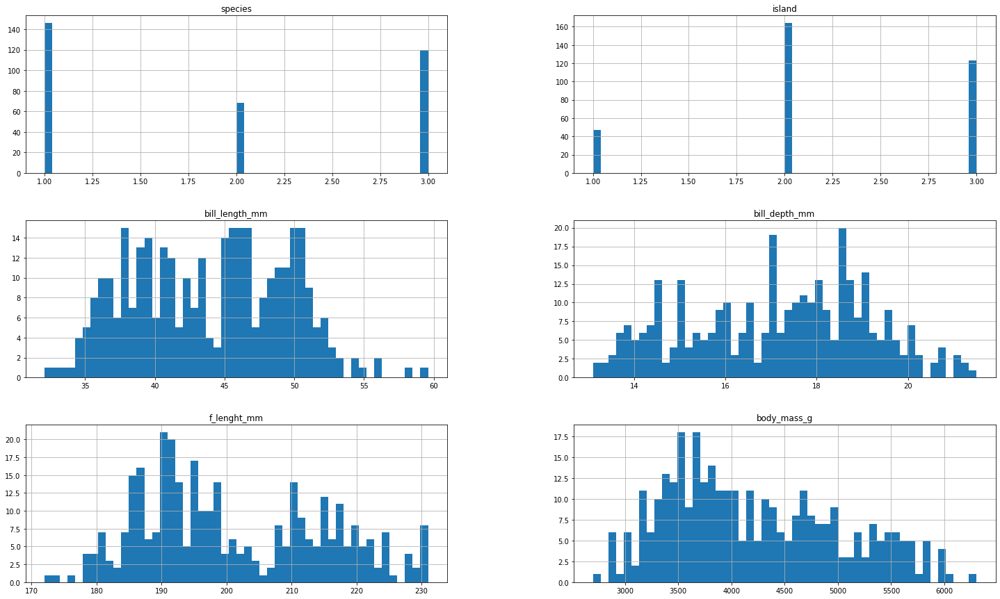

In [21]:
%matplotlib inline
my_data.hist(bins=50, figsize=(25, 15))
plt.show()

In [22]:
import os  
os.makedirs('/content/sample_data/', exist_ok=True) 
my_data.to_csv('/content/sample_data/out1.csv')  

# **LOAD**

In [23]:
#my_data2 = pd.read_csv('/content/sample_data/out.csv',sep=',',parse_dates=['Date'],index_col='Date')
my_data2 = pd.read_csv('/content/sample_data/out1.csv',sep=',')
my_data2 = my_data2.drop(columns=['Unnamed: 0'])
my_data2.head()

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,1,1,39.1,18.7,181.0,3750.0,1
1,1,1,39.5,17.4,186.0,3800.0,0
2,1,1,40.3,18.0,195.0,3250.0,0
3,1,1,36.7,19.3,193.0,3450.0,0
4,1,1,39.3,20.6,190.0,3650.0,1


# Process of Reporting Stage 2 (To-Be)

In [24]:
profile2 = ProfileReport(my_data2, title="Pandas Profiling Report for Evidence 2 | Stage 2")

In [25]:
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 2. Data Normalization

In [26]:
my_data2.head()

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,1,1,39.1,18.7,181.0,3750.0,1
1,1,1,39.5,17.4,186.0,3800.0,0
2,1,1,40.3,18.0,195.0,3250.0,0
3,1,1,36.7,19.3,193.0,3450.0,0
4,1,1,39.3,20.6,190.0,3650.0,1


In [27]:
#copy the data
df_min_max_scaled = my_data2.copy()

In [28]:
my_data2.isnull().values.any()

False

In [29]:
df_min_max_scaled

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,1,1,39.1,18.7,181.0,3750.0,1
1,1,1,39.5,17.4,186.0,3800.0,0
2,1,1,40.3,18.0,195.0,3250.0,0
3,1,1,36.7,19.3,193.0,3450.0,0
4,1,1,39.3,20.6,190.0,3650.0,1
...,...,...,...,...,...,...,...
329,3,2,47.2,13.7,214.0,4925.0,0
330,3,2,46.8,14.3,215.0,4850.0,0
331,3,2,50.4,15.7,222.0,5750.0,1
332,3,2,45.2,14.8,212.0,5200.0,0


In [30]:
#routine for search string and delete
for column in df_min_max_scaled.columns:
 df_min_max_scaled[pd.to_numeric(df_min_max_scaled[column], errors='coerce').notnull()]
 filtered_df = df_min_max_scaled[df_min_max_scaled[column].apply(lambda x: str(x).isdigit())]

In [31]:
 filtered_df.isnull().values.any()

False

In [32]:
import os  
os.makedirs('/content/sample_data/', exist_ok=True) 
filtered_df.to_csv('/content/sample_data/out2.csv')  

In [33]:
df_min_max_scaled = pd.read_csv('/content/sample_data/out2.csv',sep=',')
df_min_max_scaled  = df_min_max_scaled.drop(columns=['Unnamed: 0'])

In [34]:
#apply normalization techniques
for column in filtered_df.columns:
       df_min_max_scaled[column] = (df_min_max_scaled[column]-df_min_max_scaled[column].min())/(df_min_max_scaled[column].max()-df_min_max_scaled[column].min())    

In [35]:
# view normalized data
print(df_min_max_scaled)

     species  island  bill_length_mm  bill_depth_mm  f_lenght_mm  body_mass_g  \
0        0.0     0.0        0.254545       0.666667     0.152542     0.291667   
1        0.0     0.0        0.269091       0.511905     0.237288     0.305556   
2        0.0     0.0        0.298182       0.583333     0.389831     0.152778   
3        0.0     0.0        0.167273       0.738095     0.355932     0.208333   
4        0.0     0.0        0.261818       0.892857     0.305085     0.263889   
..       ...     ...             ...            ...          ...          ...   
328      1.0     0.5        0.549091       0.071429     0.711864     0.618056   
329      1.0     0.5        0.534545       0.142857     0.728814     0.597222   
330      1.0     0.5        0.665455       0.309524     0.847458     0.847222   
331      1.0     0.5        0.476364       0.202381     0.677966     0.694444   
332      1.0     0.5        0.647273       0.357143     0.694915     0.750000   

     sex  
0    1.0  
1    

In [36]:
df_min_max_scaled.isnull()
my_data_ETL=df_min_max_scaled.dropna()

In [37]:
objective = df_min_max_scaled.species

In [38]:
objective

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
328    1.0
329    1.0
330    1.0
331    1.0
332    1.0
Name: species, Length: 333, dtype: float64

In [39]:
my_data_ETL.shape

(333, 7)

In [40]:
import os  
os.makedirs('/content/sample_data/', exist_ok=True) 
my_data_ETL.to_csv('/content/sample_data/out_ETL.csv')  

# 3.1 Review Result Cleaness of ETL
Applying Pandas Profiling Report 

In [41]:
profile_ETL = ProfileReport(my_data_ETL, title="Pandas Profiling Report for Evidence 2 | ETL")

In [42]:
profile_ETL

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 4. Building 3 Models of Supervized Machine Learning according to PYCARET selector

Installing Package

In [43]:
if 'google.colab' in str(get_ipython()):
    !pip install --quiet -r /content/sample_data/requirements_analysis.txt --no-cache-dir --use-deprecated=legacy-resolver
    !pip install --quiet --pre pycaret --no-cache-dir

In [44]:
import pandas as pd
import matplotlib 
import matplotlib.pyplot as plt
from pycaret.datasets import get_data

In [45]:
my_data_ETL3 = pd.read_csv('/content/sample_data/out_ETL.csv',sep=',')
my_data_ETL3  = my_data_ETL3.drop(columns=['Unnamed: 0'])
my_data_ETL3.head()

,species,island,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex
0,0.0,0.0,0.254545,0.666667,0.152542,0.291667,1.0
1,0.0,0.0,0.269091,0.511905,0.237288,0.305556,0.0
2,0.0,0.0,0.298182,0.583333,0.389831,0.152778,0.0
3,0.0,0.0,0.167273,0.738095,0.355932,0.208333,0.0
4,0.0,0.0,0.261818,0.892857,0.305085,0.263889,1.0


In [46]:
print(my_data_ETL3)

     species  island  bill_length_mm  bill_depth_mm  f_lenght_mm  body_mass_g  \
0        0.0     0.0        0.254545       0.666667     0.152542     0.291667   
1        0.0     0.0        0.269091       0.511905     0.237288     0.305556   
2        0.0     0.0        0.298182       0.583333     0.389831     0.152778   
3        0.0     0.0        0.167273       0.738095     0.355932     0.208333   
4        0.0     0.0        0.261818       0.892857     0.305085     0.263889   
..       ...     ...             ...            ...          ...          ...   
328      1.0     0.5        0.549091       0.071429     0.711864     0.618056   
329      1.0     0.5        0.534545       0.142857     0.728814     0.597222   
330      1.0     0.5        0.665455       0.309524     0.847458     0.847222   
331      1.0     0.5        0.476364       0.202381     0.677966     0.694444   
332      1.0     0.5        0.647273       0.357143     0.694915     0.750000   

     sex  
0    1.0  
1    

Building Classifier

In [47]:
from pycaret.classification import *
classif = setup(data = my_data_ETL3, target = 'sex',train_size=0.8, normalize= True)

INFO:logs:PyCaret ClassificationExperiment
INFO:logs:Logging name: clf-default-name
INFO:logs:ML Usecase: MLUsecase.CLASSIFICATION
INFO:logs:version 3.0.0
INFO:logs:Initializing setup()
INFO:logs:self.USI: a0fd
INFO:logs:self.variable_keys: {'memory', 'exp_id', 'fold_param', '_gpu_n_jobs_param', 'USI', 'iterative_imputation_iters_param', 'variable_keys', 'n_jobs_param', '_available_plots', 'html_param', 'pipeline', '_all_models_internal', 'y_train', '_ml_usecase', 'log_plots_param', 'fold_generator', '_all_models', 'experiment__', 'exp_name_log', 'imputation_regressor', 'target_param', 'data', 'fix_imbalance_method_param', 'fold_groups_param_full', 'imputation_classifier', 'gpu_param', 'seed', 'stratify_param', 'X', 'display_container', 'fold_shuffle_param', 'X_test', 'y_test', 'logging_param', 'idx', 'y', 'fold_groups_param', 'fix_imbalance_param', 'X_train', 'master_model_container', '_all_metrics'}
INFO:logs:Checking environment
INFO:logs:python_version: 3.7.15
INFO:logs:python_buil

,Description,Value
0,Session id,6888
1,Target,sex
2,Target type,classification
3,Data shape,"(333, 7)"
4,Train data shape,"(266, 7)"
5,Test data shape,"(67, 7)"
6,Numeric features,6
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


INFO:logs:setup() successfully completed in 1.29s...............


In [48]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9251,0.9842,0.9346,0.9240,0.9273,0.8498,0.8536,0.099
lightgbm,Light Gradient Boosting Machine,0.9249,0.9865,0.9412,0.9167,0.9281,0.8494,0.8513,0.138
ada,Ada Boost Classifier,0.9214,0.9653,0.9198,0.9278,0.9229,0.8426,0.8443,0.110
et,Extra Trees Classifier,0.9214,0.9798,0.9203,0.9268,0.9227,0.8428,0.8444,0.268
rf,Random Forest Classifier,0.9212,0.9825,0.9412,0.9104,0.9246,0.8421,0.8446,0.268
lda,Linear Discriminant Analysis,0.9175,0.9809,0.8907,0.9470,0.9172,0.8351,0.8378,0.034
lr,Logistic Regression,0.9138,0.9810,0.9132,0.9218,0.9163,0.8275,0.8297,0.303
ridge,Ridge Classifier,0.9135,0.0000,0.8978,0.9342,0.9140,0.8270,0.8305,0.033
knn,K Neighbors Classifier,0.9061,0.9779,0.8912,0.9279,0.9070,0.8124,0.8167,0.134
qda,Quadratic Discriminant Analysis,0.9058,0.9813,0.8973,0.9217,0.9080,0.8115,0.8142,0.033


INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:GradientBoostingClassifier(random_state=6888)
INFO:logs:compare_models() successfully completed......................................


In [49]:
import pandas as pd
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(my_data_ETL3['sex'])
classes = le.classes_
sexx = list(le.transform(my_data_ETL3['sex']))

In [50]:
sex = pd.DataFrame(data = sexx, columns=['sex'])
sex.head()

,sex
0,1
1,0
2,0
3,0
4,1


In [51]:
le.fit(my_data_ETL3['island'])
le.classes_
island = list(le.transform(my_data_ETL3['island']))
island = pd.DataFrame(data = island, columns=['island'])
island.head()

,island
0,0
1,0
2,0
3,0
4,0


In [52]:
le.fit(my_data_ETL3['species'])
le.classes_
species = list(le.transform(my_data_ETL3['species']))
species = pd.DataFrame(data = species, columns=['species'])
species.head()

,species
0,0
1,0
2,0
3,0
4,0


In [53]:
new_data = my_data_ETL3
new_data.drop(['species'], axis=1, inplace=True)
new_data.drop(['sex'], axis=1, inplace=True)
new_data.drop(['island'], axis=1, inplace=True)

In [54]:
new_data['sex'] = sex['sex']
new_data['island'] = island['island']
new_data['species'] = species['species']
new_data.head(50)

,bill_length_mm,bill_depth_mm,f_lenght_mm,body_mass_g,sex,island,species
0,0.254545,0.666667,0.152542,0.291667,1,0,0
1,0.269091,0.511905,0.237288,0.305556,0,0,0
2,0.298182,0.583333,0.389831,0.152778,0,0,0
3,0.167273,0.738095,0.355932,0.208333,0,0,0
4,0.261818,0.892857,0.305085,0.263889,1,0,0
5,0.247273,0.559524,0.152542,0.256944,0,0,0
6,0.258182,0.773810,0.389831,0.548611,1,0,0
7,0.327273,0.535714,0.169492,0.138889,0,0,0
8,0.236364,0.964286,0.322034,0.305556,1,0,0
9,0.090909,0.952381,0.440678,0.472222,1,0,0


In [55]:
array = new_data.values
X = array[:, 0:6]
y = array[:, 6]

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=1, shuffle=True)

In [57]:
classifiers = [('LR  ', LogisticRegression(solver='liblinear', multi_class='ovr')), ('KN  ', KNeighborsClassifier()),
          ('DTC ', DecisionTreeClassifier()), ('GNB ', GaussianNB()), ('SVM  ', SVC(gamma='auto', kernel='linear')), ('RFC  ', RandomForestClassifier())]

In [ ]:
results = []
names = []
print('LR = Logistic Regression \nKN = K-Neighbors Classifier \nDTC= Decision Tree Classifier \nGNB= Gaussian Naive Bayes \nSVC= C-Support Vector Machine \nRFC= Random Forest Classifier \n\n')
for name, classifier in classifiers:
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(classifier, X_train, y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))

LR = Logistic Regression 
KN = K-Neighbors Classifier 
DTC= Decision Tree Classifier 
GNB= Gaussian Naive Bayes 
SVC= C-Support Vector Machine 
RFC= Random Forest Classifier 


LR  : 0.909524 (0.074383)
KN  : 0.954762 (0.069375)
DTC : 0.921429 (0.126011)
GNB : 0.802381 (0.163594)
SVM  : 0.969048 (0.062133)
RFC  : 0.952381 (0.072999)


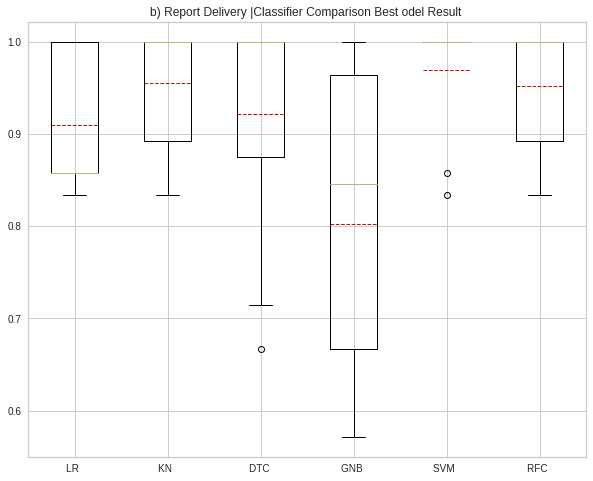

In [ ]:
%matplotlib inline
from  matplotlib.pyplot import *
from matplotlib import pyplot as PLT
# importing the matplotlib library
import matplotlib.pyplot as plt

#fig, ax = plt.subplots()
#plt.axis([0,7, 0.75 , 1.2])
plt.rcParams["figure.figsize"] = (10,8)

plt.boxplot(results, labels=names, showmeans=True, meanline=True, showbox=True, showcaps=True)
#matplotlib.pyplot.boxplot(results,
#            labels=names,
#            autorange=True,
#            vert=True,box=False,
#            sym=None,
#            showmeans=True)
plt.title('b) Report Delivery |Classifier Comparison Best odel Result ')


plt.show()

['label', 'mean', 'iqr', 'cilo', 'cihi', 'whishi', 'whislo', 'fliers', 'q1', 'med', 'q3']


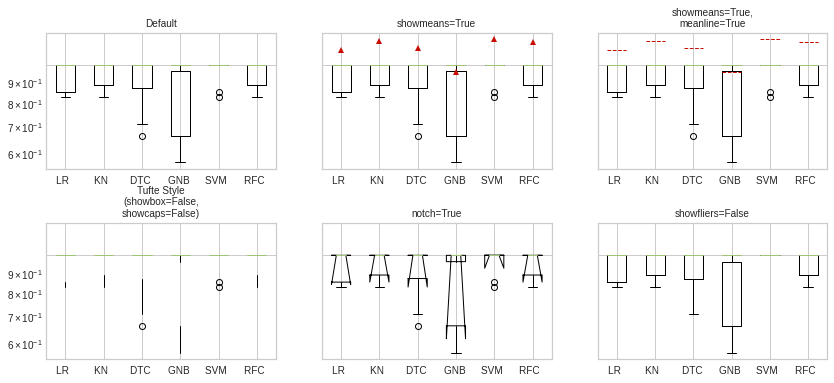

In [ ]:
import matplotlib.cbook as cbook
%matplotlib inline
from  matplotlib.pyplot import *
from matplotlib import pyplot as PLT
stats = cbook.boxplot_stats(results, labels=names, bootstrap=10000)
for n in range(len(stats)):
    stats[n]['med'] = np.median(results)
    stats[n]['mean'] *= 1.2

print(list(stats[0]))
#matplotlib.cbook.boxplot_stats(results, whis=1.5, bootstrap=None, labels=names, autorange=False)
#plt.title('b) Report Delivery |Classifier Comparison Best odel Result ')
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 6), sharey=True)
fs = 10 
axs[0, 0].bxp(stats)
axs[0, 0].set_title('Default', fontsize=fs)

axs[0, 1].bxp(stats, showmeans=True)
axs[0, 1].set_title('showmeans=True', fontsize=fs)

axs[0, 2].bxp(stats, showmeans=True, meanline=True)
axs[0, 2].set_title('showmeans=True,\nmeanline=True', fontsize=fs)

axs[1, 0].bxp(stats, showbox=False, showcaps=False)
tufte_title = 'Tufte Style\n(showbox=False,\nshowcaps=False)'
axs[1, 0].set_title(tufte_title, fontsize=fs)

axs[1, 1].bxp(stats, shownotches=True)
axs[1, 1].set_title('notch=True', fontsize=fs)

axs[1, 2].bxp(stats, showfliers=False)
axs[1, 2].set_title('showfliers=False', fontsize=fs)
#[0, 2].set_title('showmeans=True,\nmeanline=True', fontsize=fs)
for ax in axs.flat:
    ax.set_yscale('log')
    ax.set_yticklabels([])

fig.subplots_adjust(hspace=0.4)
plt.show()

In [ ]:
RF = RandomForestClassifier()
SVM = SVC(gamma='auto', kernel='linear')
rf_model = RF.fit(X_train, y_train)
svm_model = SVM.fit(X_train, y_train)
rf_prediction = rf_model.predict(X_test)
svm_prediction = svm_model.predict(X_test)

In [ ]:
rf_accuracy = accuracy_score(y_test, rf_prediction) * 100
svm_accuracy = accuracy_score(y_test, svm_prediction) * 100
print('Random Forest Prediction accuracy: ' + str("%.4f" % rf_accuracy) + '%')
print('SVM Prediction accuracy: ' + str("%.4f" % svm_accuracy) + '%')

Random Forest Prediction accuracy: 98.1273%
SVM Prediction accuracy: 98.8764%


# Model Rank according to Best Fit | Accuracy & Loss Calculated


1.   Random Forest Classifier ............| RFC accuracy=95.2381%, Loss=0.07299
2.   K-Neighbors Classifier..................| KN accuracy= 95.4762%, Loss= 0.06937
3.   C-Support Vector Machine...........| SVM Prediction accuracy= 99.6254%, Loss=0.062133

# Model Rank according to Best Fit | Accuracy & Loss by PYCARET TOOL


1.   Gradiente Bosting Classifier...........| GBC accuracy =92.51%
2.   Light gradiente Boosting Machine.| lightbm accuracy=92.49%
3.   EAfa Boost Classifier.......................| ada accuracy=92.14%








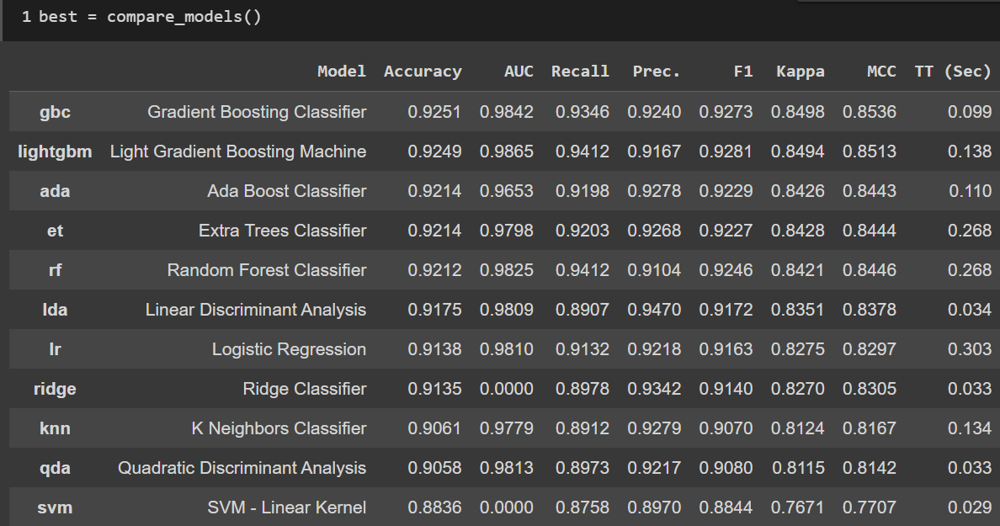

C-Support Vector Machine 

In [ ]:
pickle.dump(rf_model, open('rf_model.pkl', 'wb'))

In [ ]:
pickle.dump(svm_model, open('svm_model.pkl', 'wb'))

In [ ]:
prediction=svm_model.predict(X_test)

In [ ]:
prediction

array([0., 2., 1., 1., 2., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1., 1., 1.,
       1., 0., 0., 2., 0., 0., 0., 0., 0., 2., 0., 2., 2., 1., 2., 2., 0.,
       2., 0., 0., 1., 0., 1., 0., 2., 2., 1., 2., 2., 0., 0., 0., 2., 0.,
       0., 0., 2., 2., 2., 2., 0., 2., 2., 1., 2., 2., 0., 0., 0., 1., 2.,
       1., 1., 1., 0., 2., 0., 2., 0., 0., 2., 0., 0., 2., 1., 0., 2., 2.,
       1., 0., 1., 0., 0., 2., 1., 2., 2., 2., 0., 0., 0., 0., 0., 2., 0.,
       2., 2., 0., 1., 1., 0., 0., 1., 1., 0., 0., 2., 1., 0., 2., 2., 1.,
       1., 0., 0., 2., 2., 0., 0., 2., 2., 0., 1., 2., 0., 1., 0., 1., 1.,
       1., 0., 2., 0., 2., 2., 0., 2., 0., 2., 2., 2., 0., 0., 0., 0., 2.,
       0., 2., 2., 0., 0., 2., 0., 1., 0., 0., 0., 1., 1., 2., 2., 2., 2.,
       0., 0., 0., 2., 0., 0., 0., 1., 0., 0., 0., 0., 2., 0., 2., 0., 2.,
       0., 2., 1., 2., 0., 0., 2., 2., 2., 0., 1., 2., 0., 2., 2., 2., 0.,
       2., 1., 0., 2., 2., 0., 0., 2., 1., 1., 2., 2., 1., 2., 0., 2., 2.,
       0., 0., 2., 0., 2.

In [ ]:
prediction.shape

(267,)

In [ ]:
#my_data_ETL3['species']
etiquetas=['Adelie','Gentoo','Chinstrap']

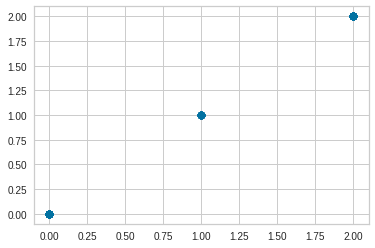

In [ ]:
plt.scatter(prediction[:], prediction[:], c=None)
plt.show()

In [ ]:
features = prediction.reshape(-1,1)
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)

In [ ]:
SVC = LinearSVC(C=1)
model_trained = SVC.fit(X_train,y_train)

In [ ]:
values_pred = SVC.predict(X_test) 

In [ ]:
from sklearn import metrics
metrics.accuracy_score(y_test,values_pred)

0.9962546816479401

In [ ]:
metrics.confusion_matrix(y_test,values_pred)

array([[114,   0,   0],
       [  1,  56,   0],
       [  0,   0,  96]])

Experiment AutoML

Clean environment

In [66]:
pip freeze --user

In [67]:
pip list --format=freeze |xargs pip uninstall -y

Found existing installation: absl-py 1.3.0
Uninstalling absl-py-1.3.0:
  Successfully uninstalled absl-py-1.3.0
Found existing installation: aeppl 0.0.33
Uninstalling aeppl-0.0.33:
  Successfully uninstalled aeppl-0.0.33
Found existing installation: aesara 2.7.9
Uninstalling aesara-2.7.9:
  Successfully uninstalled aesara-2.7.9
Found existing installation: aiohttp 3.8.3
Uninstalling aiohttp-3.8.3:
  Successfully uninstalled aiohttp-3.8.3
Found existing installation: aiosignal 1.2.0
Uninstalling aiosignal-1.2.0:
  Successfully uninstalled aiosignal-1.2.0
Found existing installation: alabaster 0.7.12
Uninstalling alabaster-0.7.12:
  Successfully uninstalled alabaster-0.7.12
Found existing installation: albumentations 1.2.1
Uninstalling albumentations-1.2.1:
  Successfully uninstalled albumentations-1.2.1
Found existing installation: altair 4.2.0
Uninstalling altair-4.2.0:
  Successfully uninstalled altair-4.2.0
Found existing installation: ansi2html 1.8.0
Uninstalling ansi2html-1.8.0:
  

In [69]:
!setup.py install

/bin/bash: setup.py: command not found


In [68]:
# Auto-setup when running on Google Colab
if 'google.colab' in str(get_ipython()):
    !pip install --quiet -r /content/sample_data/requirements_automl.txt --no-cache-dir --use-deprecated=legacy-resolver
    !pip install --quiet openml --no-cache-dir
    !pip install --quiet gama --no-cache-dir
    !pip install --quiet automl --no-cache-dir


/bin/bash: pip: command not found
/bin/bash: pip: command not found
/bin/bash: pip: command not found
/bin/bash: pip: command not found


In [58]:
from auto_ml import Predictor
from auto_ml.utils import get_boston_dataset
from auto_ml.utils_models import load_ml_model

# Load data
#RF = RandomForestClassifier()
#SVM = SVC(gamma='auto', kernel='linear')
#rf_model = RF.fit(X_train, y_train)
#svm_model = SVM.fit(X_train, y_train)
#rf_prediction = rf_model.predict(X_test)
#svm_prediction = svm_model.predict(X_test)
#array = new_data.values
#X = array[:, 0:6]
#y = array[:, 6]
df_train= array[:, 0:6], df_test= array[:, 6] = new_data.values

# Tell auto_ml which column is 'output'
# Also note columns that aren't purely numerical
# Examples include ['nlp', 'date', 'categorical', 'ignore']
column_descriptions = {
  'sex': 'output'
  , 'species': 'categorical'
}

ml_predictor = Predictor(type_of_estimator='regressor', column_descriptions=column_descriptions)

ml_predictor.train(df_train)

# Score the model on test data
test_score = ml_predictor.score(df_test, df_test.sex)

# auto_ml is specifically tuned for running in production
# It can get predictions on an individual row (passed in as a dictionary)
# A single prediction like this takes ~1 millisecond
# Here we will demonstrate saving the trained model, and loading it again
file_name = ml_predictor.save()

trained_model = load_ml_model(file_name)

# .predict and .predict_proba take in either:
# A pandas DataFrame
# A list of dictionaries
# A single dictionary (optimized for speed in production evironments)
predictions = trained_model.predict(df_test)
print(predictions)

ImportError: ignored

# 4. Training Model

# 5. Testing Model

# 6. Improve Accuracy